In [150]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import glob

#reading files
import rasterio
import rioxarray
import xarray as xr
from PIL import Image

In [151]:
#reading the images
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/*/*/*.tif")
print(len(img_path))

221


In [152]:
img = rioxarray.open_rasterio(img_path[0])

for i in img_path:
    img = rioxarray.open_rasterio(i)
    assert img.shape == (4, 164, 222)
print(f"shape is correct{img.shape}")

shape is correct(4, 164, 222)


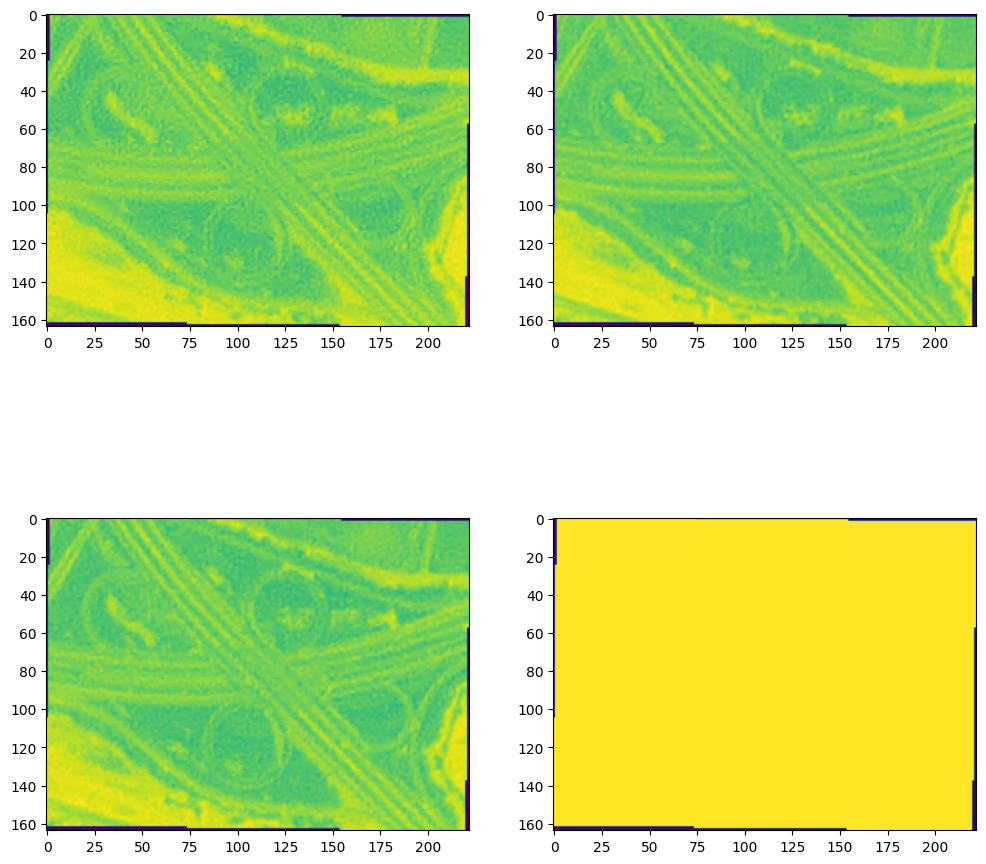

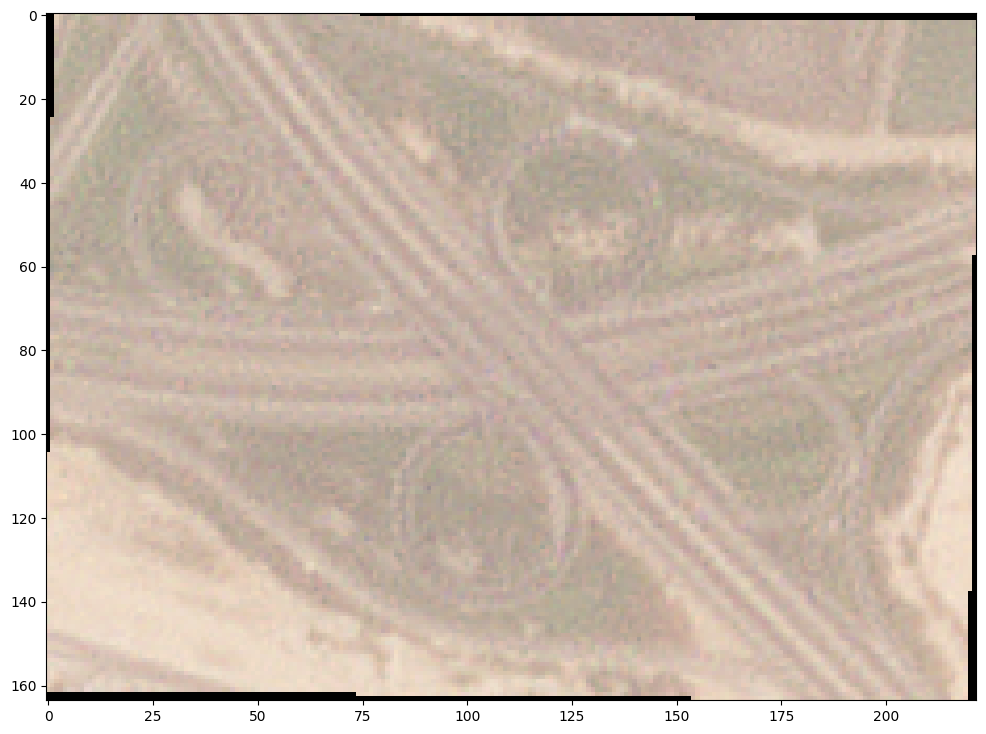

In [153]:
#plot all bands of the image
plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.imshow(img.data[0]) 
plt.subplot(222)    
plt.imshow(img.data[1])
plt.subplot(223)
plt.imshow(img.data[2])
plt.subplot(224)
plt.imshow(img.data[3])

#plotting the first three bands of the image
plt.figure(figsize=(12, 12))
plt.imshow(img.data[0:3].transpose(1, 2, 0))

### Taking median pixel over time

(164, 222, 3)


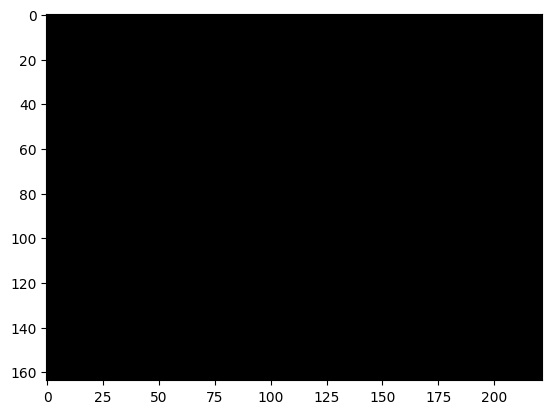

In [154]:
background_img = np.zeros(img.data[0:3].transpose(1, 2, 0).shape)
#initially 
plt.imshow(background_img)
print(background_img.shape)

In [155]:
def create_median_image(images_path):

    first_img = rioxarray.open_rasterio(images_path[0])

    width, height = first_img.data[0:3].transpose(1, 2, 0).shape[0:2]
    num_images = len(images_path)

    red_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    green_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    blue_values = np.zeros(( width,height, num_images), dtype=np.uint8)


    for i,j in enumerate(img_path):
        img = rioxarray.open_rasterio(j).data[0:3].transpose(1, 2, 0)
        red_values[:, :, i], green_values[:, :, i], blue_values[:, :, i] = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    
    red_median = np.median(red_values, axis=2)
    green_median = np.median(green_values, axis=2)
    blue_median = np.median(blue_values, axis=2)
    img_arr = np.uint8(np.dstack((red_median, green_median, blue_median)))
    median_image = Image.fromarray(img_arr)
    
    return img_arr, median_image


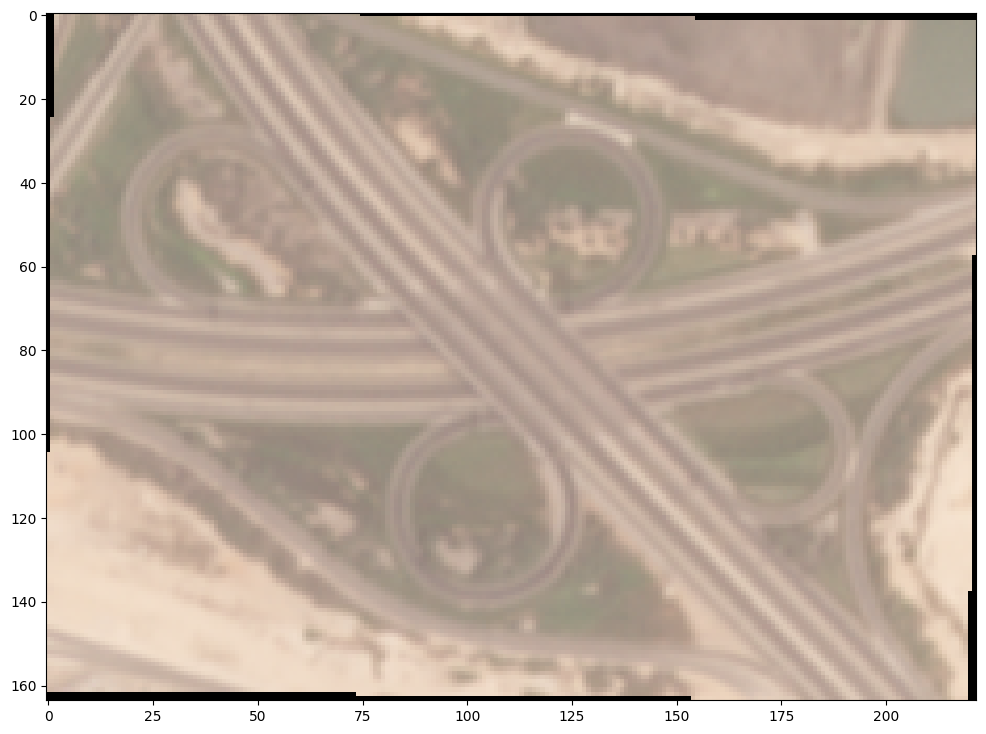

In [156]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(12, 12))
plt.imshow(out)

### Ploting Median Image vs other images


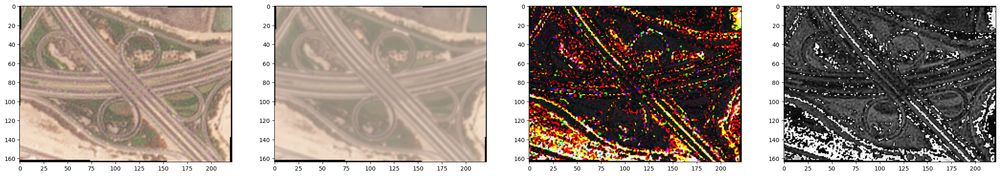

In [171]:
###Ploting Median Image vs other images
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)
out, _ = create_median_image(img_path)

plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(out)
plt.subplot(143)
plt.imshow(out-eg_img_1)
# plt.subplot(144)
# a = out-eg_img_1
# plt.imshow(a[:,:,0] + a[:,:,1] + a[:,:,2], cmap='gray')

In [ ]:
### To Do : Radiometric correction of the images
# https://www.harrisgeospatial.com/docs/BackgroundRadiometricCorrection.html

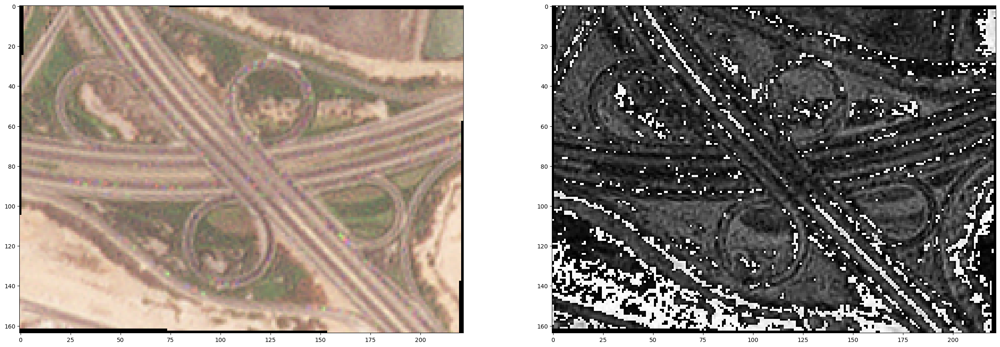

In [166]:
plt.figure(figsize=(30, 30))
plt.subplot(121)
plt.imshow(eg_img_1)
plt.subplot(122)
a = out-eg_img_1
plt.imshow(a[:,:,0] + a[:,:,1] + a[:,:,2], cmap='gray')


### Median filter on one image

In [94]:
import cv2

def apply_median_filter(image, k = 3):
    # Apply the median filter to each color channel
    filtered_channels = [cv2.medianBlur(image[:,:,i], ksize=k) for i in range(3)]

    # Merge the filtered color channels back into an RGB image
    filtered_image = cv2.merge(filtered_channels)
    return filtered_image


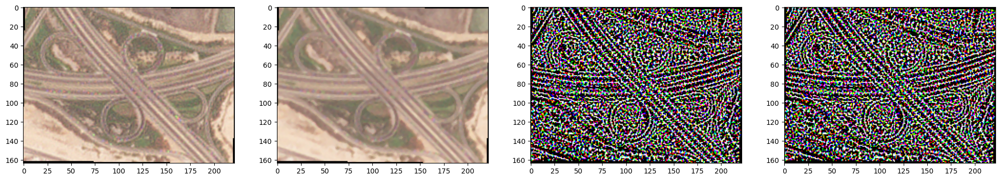

In [111]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)

plt.figure(figsize=(25, 25))
plt.subplot(141)    
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(apply_median_filter(eg_img_1))
plt.subplot(143)
plt.imshow(eg_img_1-apply_median_filter(eg_img_1))
plt.subplot(144)
plt.imshow(np.abs(eg_img_1-apply_median_filter(eg_img_1)))


# filtered_image = apply_median_filter(eg_img_1)

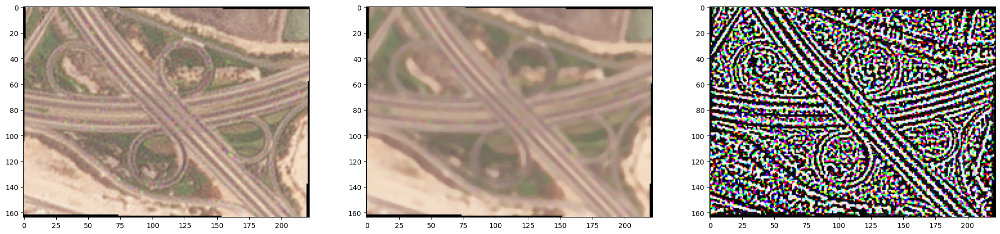

In [105]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)

plt.figure(figsize=(25, 25))
plt.subplot(131)    
plt.imshow(eg_img_1)
plt.subplot(132)
plt.imshow(apply_median_filter(eg_img_1, k=5))
plt.subplot(133)
plt.imshow(eg_img_1-apply_median_filter(eg_img_1, k=5))


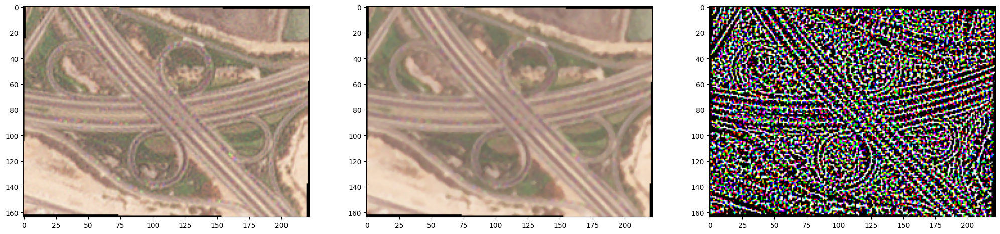

In [106]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/AlAinRoad-Dubai/adb6abf2-14b1-4760-9ec2-d4267f564bde/PSScene/20210801_065621_73_2254_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)

plt.figure(figsize=(25, 25))
plt.subplot(131)    
plt.imshow(eg_img_1)
plt.subplot(132)
plt.imshow(apply_median_filter(eg_img_1))
plt.subplot(133)
plt.imshow(eg_img_1-apply_median_filter(eg_img_1))


### NL-Means Denoising


In [123]:
### NL-Means Denoising
import cv2

def apply_nl_means_denoising(image, h = 3, template_window_size = 7, search_window_size = 21):
    # Apply the non-local means filter to each color channel
    filtered_channels = [cv2.fastNlMeansDenoising(image[:,:,i], h=h, 
                                                  templateWindowSize=template_window_size, 
                                                  searchWindowSize=search_window_size) for i in range(3)]

    # Merge the filtered color channels back into an RGB image
    filtered_image = cv2.merge(filtered_channels)
    return filtered_image

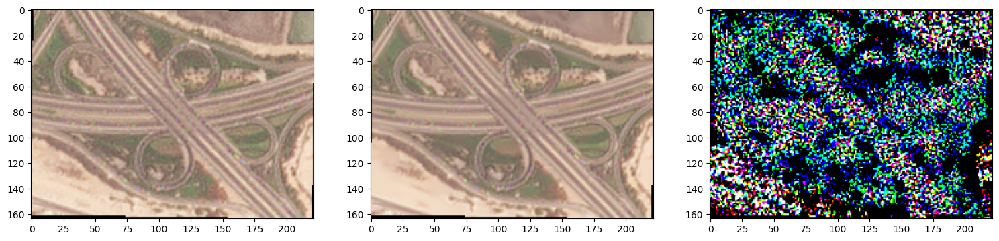

In [125]:
plt.figure(figsize=(25, 25))    
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(apply_nl_means_denoising(eg_img_1, h=5))
plt.subplot(143)
plt.imshow(eg_img_1-apply_nl_means_denoising(eg_img_1, h=5))
# plt.subplot(144)
# plt.imshow(np.abs(eg_img_1-apply_nl_means_denoising(eg_img_1)))


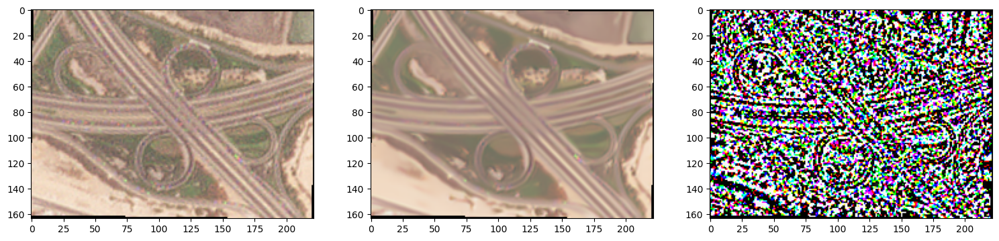

In [130]:
#h = 10
plt.figure(figsize=(25, 25))
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)    
plt.imshow(apply_nl_means_denoising(eg_img_1, h=10))
plt.subplot(143)
plt.imshow(eg_img_1-apply_nl_means_denoising(eg_img_1, h=10))

### Experiment 2: Changing the dataset: parking lot Saarbazar

In [173]:
img_path = glob.glob("/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Saarbasar/*/*/*.tif")
print(len(img_path))

250


In [174]:
img = rioxarray.open_rasterio(img_path[0])

for i in img_path:
    img = rioxarray.open_rasterio(i)
    assert img.shape == (4, 142, 136)
print(f"shape is correct{img.shape}")

shape is correct(4, 142, 136)


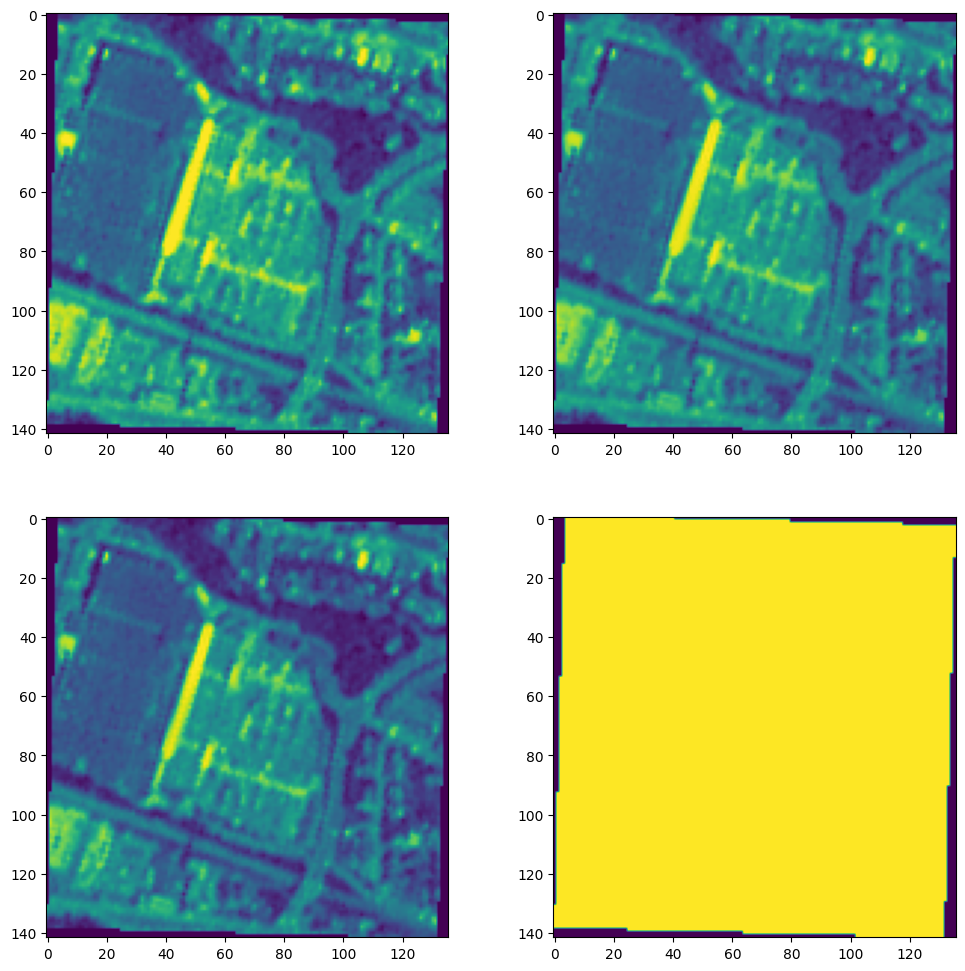

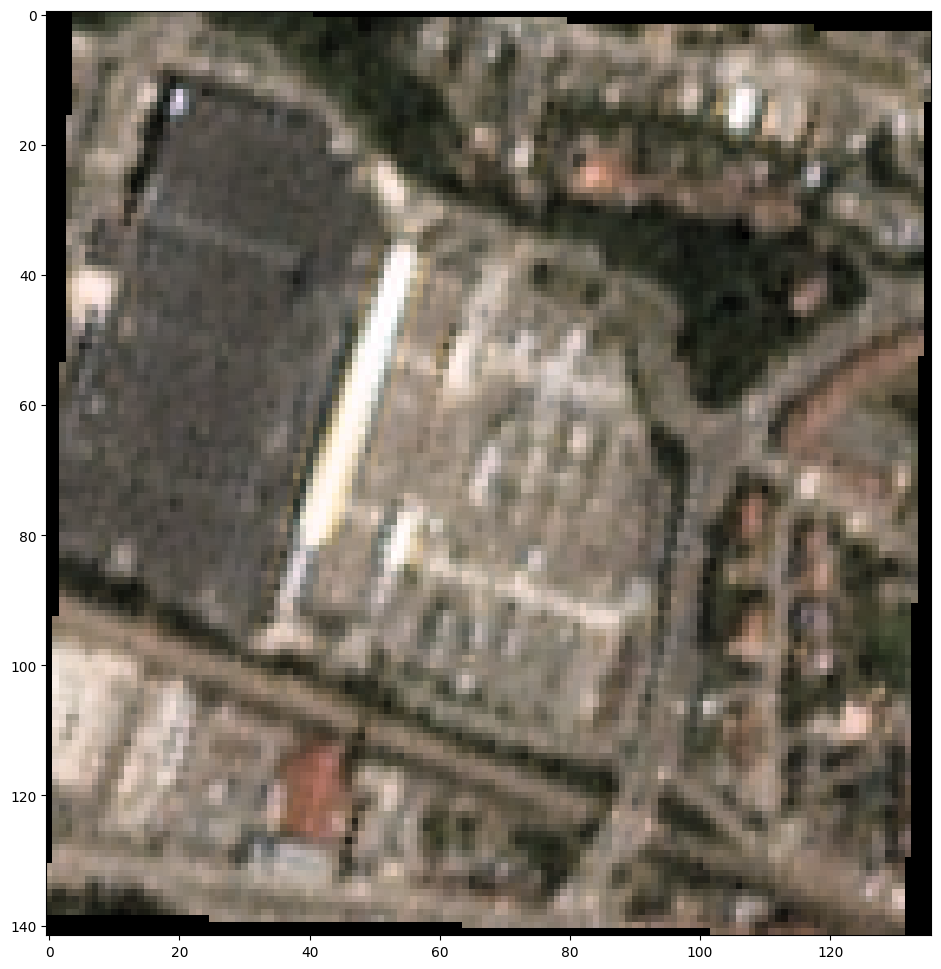

In [175]:
#plot all bands of the image
plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.imshow(img.data[0]) 
plt.subplot(222)    
plt.imshow(img.data[1])
plt.subplot(223)
plt.imshow(img.data[2])
plt.subplot(224)
plt.imshow(img.data[3])

#plotting the first three bands of the image
plt.figure(figsize=(12, 12))
plt.imshow(img.data[0:3].transpose(1, 2, 0))

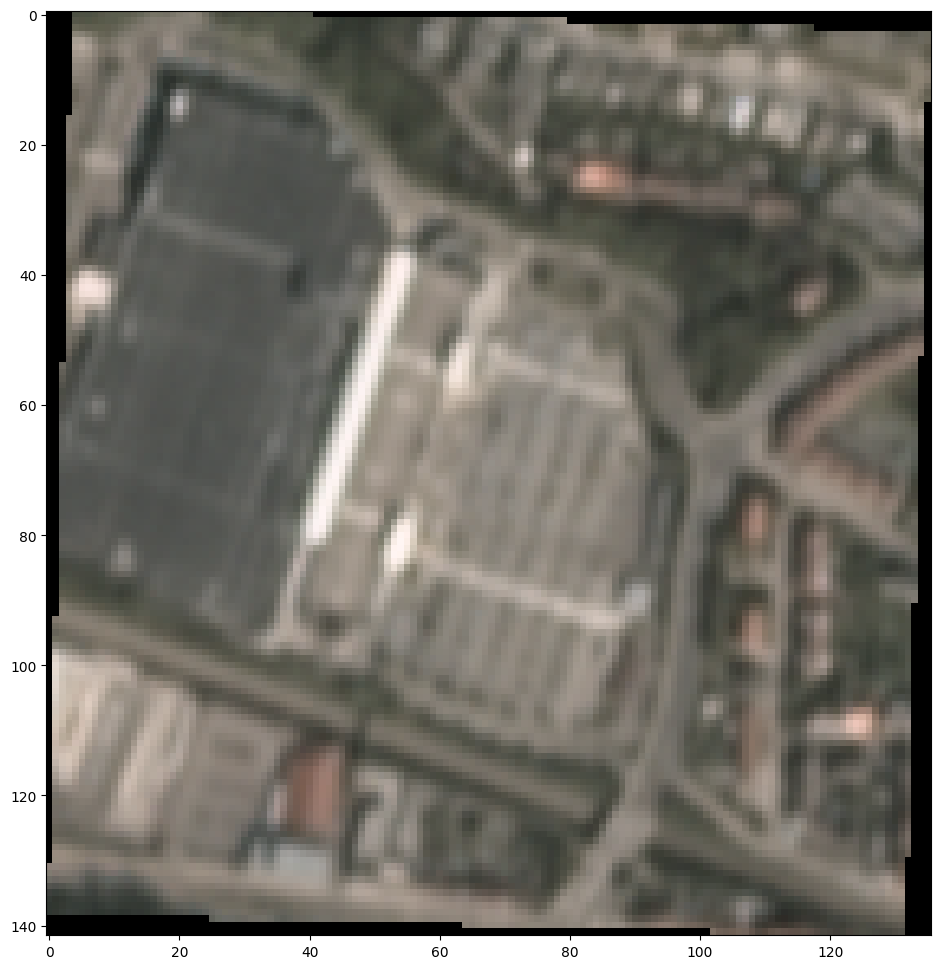

In [176]:
out, _ = create_median_image(img_path)
plt.figure(figsize=(12, 12))
plt.imshow(out)

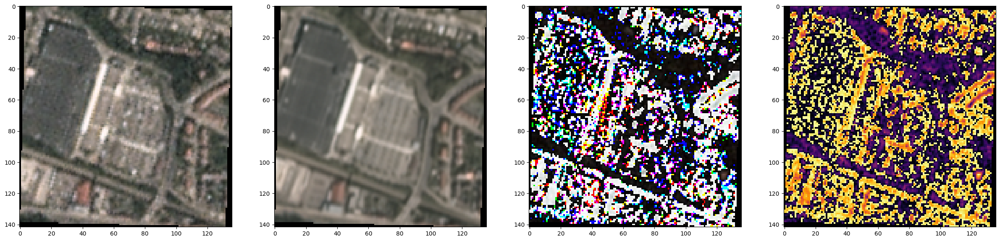

In [177]:
eg_img_1 = rioxarray.open_rasterio('/home/akansh-i2sc/Desktop/Research@Societal/detect-car-LR/data/Saarbasar/c40e4b0a-3c0d-408f-9022-67bc16fac2b8/PSScene/20170828_094335_103d_3B_Visual_clip.tif').data[0:3].transpose(1, 2, 0)
out, _ = create_median_image(img_path)

plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(eg_img_1)
plt.subplot(142)
plt.imshow(out)
plt.subplot(143)
plt.imshow(out-eg_img_1)
plt.subplot(144)
a = out-eg_img_1
plt.imshow(a[:,:,0]+a[:,:,1]+a[:,:,2], cmap='inferno')